# Problem Statement

The major objective of this data set is to extract actionable insights from the leading life insurance company data and make strategic changes to make the company grow. Primary objective is to create Machine Learning models which correctly predicts the bonus for its agents so that it may provide information regarding high performing agents and low performing agents. Once a model is developed then it can extract actionable insights and recommendation, so based of which the company may design appropriate engagement activity and upskill programs for their agents as required.

# Import Libraries

In [1]:
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
import sklearn.metrics as metrics
import warnings
warnings.filterwarnings("ignore")
%matplotlib inline

# Import Data

In [2]:
df=pd.read_excel('Sales_Data_EDA.xlsx',sheet_name="Sales")

# Data Info - Types of Features

### Data Description

In [3]:
data_description=pd.read_excel('Sales_Data_EDA.xlsx',sheet_name='Data Dict')
data_description.drop('Unnamed: 0',axis=1,inplace=True)
data_description.rename(columns={"Unnamed: 1":"Data","Unnamed: 2":"Variable","Unnamed: 3":"Discerption"},inplace=True)
data_description.drop(0,axis=0,inplace=True)
data_description

,Data,Variable,Discerption
1,Sales,CustID,Unique customer ID
2,Sales,AgentBonus,Bonus amount given to each agents in last month
3,Sales,Age,Age of customer
4,Sales,CustTenure,Tenure of customer in organization
5,Sales,Channel,Channel through which acquisition of customer ...
6,Sales,Occupation,Occupation of customer
7,Sales,EducationField,Field of education of customer
8,Sales,Gender,Gender of customer
9,Sales,ExistingProdType,Existing product type of customer
10,Sales,Designation,Designation of customer in their organization


In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4520 entries, 0 to 4519
Data columns (total 20 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   CustID                4520 non-null   int64  
 1   AgentBonus            4520 non-null   int64  
 2   Age                   4251 non-null   float64
 3   CustTenure            4294 non-null   float64
 4   Channel               4520 non-null   object 
 5   Occupation            4520 non-null   object 
 6   EducationField        4520 non-null   object 
 7   Gender                4520 non-null   object 
 8   ExistingProdType      4520 non-null   int64  
 9   Designation           4520 non-null   object 
 10  NumberOfPolicy        4475 non-null   float64
 11  MaritalStatus         4520 non-null   object 
 12  MonthlyIncome         4284 non-null   float64
 13  Complaint             4520 non-null   int64  
 14  ExistingPolicyTenure  4336 non-null   float64
 15  SumAssured           

# Data head

In [5]:
df.head(10).T

,0,1,2,3,4,5,6,7,8,9
CustID,7000000,7000001,7000002,7000003,7000004,7000005,7000006,7000007,7000008,7000009
AgentBonus,4409,2214,4273,1791,2955,3252,3850,2073,2719,3247
Age,22.0,11.0,26.0,11.0,6.0,7.0,12.0,6.0,8.0,6.0
CustTenure,4.0,2.0,4.0,NaN,NaN,NaN,23.0,4.0,11.0,3.0
Channel,Agent,Third Party Partner,Agent,Third Party Partner,Agent,Third Party Partner,Agent,Agent,Agent,Online
Occupation,Salaried,Salaried,Free Lancer,Salaried,Small Business,Salaried,Salaried,Small Business,Salaried,Small Business
EducationField,Graduate,Graduate,Post Graduate,Graduate,UG,Graduate,Graduate,Under Graduate,Graduate,Under Graduate
Gender,Female,Male,Male,Fe male,Male,Male,Male,Female,Male,Male
ExistingProdType,3,4,4,3,3,3,4,3,4,2
Designation,Manager,Manager,Exe,Executive,Executive,Executive,VP,Executive,Manager,Exe


In [6]:
df.describe()

,CustID,AgentBonus,Age,CustTenure,ExistingProdType,NumberOfPolicy,MonthlyIncome,Complaint,ExistingPolicyTenure,SumAssured,LastMonthCalls,CustCareScore
count,4.520000e+03,4520.000000,4251.000000,4294.000000,4520.000000,4475.000000,4284.000000,4520.000000,4336.000000,4.366000e+03,4520.000000,4468.000000
mean,7.002260e+06,4077.838274,14.494707,14.469027,3.688938,3.565363,22890.309991,0.287168,4.130074,6.199997e+05,4.626991,3.067592
std,1.304956e+03,1403.321711,9.037629,8.963671,1.015769,1.455926,4885.600757,0.452491,3.346386,2.462348e+05,3.620132,1.382968
min,7.000000e+06,1605.000000,2.000000,2.000000,1.000000,1.000000,16009.000000,0.000000,1.000000,1.685360e+05,0.000000,1.000000
25%,7.001130e+06,3027.750000,7.000000,7.000000,3.000000,2.000000,19683.500000,0.000000,2.000000,4.394432e+05,2.000000,2.000000
50%,7.002260e+06,3911.500000,13.000000,13.000000,4.000000,4.000000,21606.000000,0.000000,3.000000,5.789765e+05,3.000000,3.000000
75%,7.003389e+06,4867.250000,20.000000,20.000000,4.000000,5.000000,24725.000000,1.000000,6.000000,7.582360e+05,8.000000,4.000000
max,7.004519e+06,9608.000000,58.000000,57.000000,6.000000,6.000000,38456.000000,1.000000,25.000000,1.838496e+06,18.000000,5.000000


# Check shape of data

In [7]:
print('The number of rows (observations) is',df.shape[0],'\n''The number of columns (variables) is',df.shape[1])

The number of rows (observations) is 4520 
The number of columns (variables) is 20


# Measures of Central Tendency

In [8]:
pd.set_option('max_rows', None)
pd.options.display.float_format = '{:.2f}'.format   
df.describe(include='all').T

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
CustID,4520.00,NaN,NaN,NaN,7002259.50,1304.96,7000000.00,7001129.75,7002259.50,7003389.25,7004519.00
AgentBonus,4520.00,NaN,NaN,NaN,4077.84,1403.32,1605.00,3027.75,3911.50,4867.25,9608.00
Age,4251.00,NaN,NaN,NaN,14.49,9.04,2.00,7.00,13.00,20.00,58.00
CustTenure,4294.00,NaN,NaN,NaN,14.47,8.96,2.00,7.00,13.00,20.00,57.00
Channel,4520,3,Agent,3194,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Occupation,4520,5,Salaried,2192,NaN,NaN,NaN,NaN,NaN,NaN,NaN
EducationField,4520,7,Graduate,1870,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Gender,4520,3,Male,2688,NaN,NaN,NaN,NaN,NaN,NaN,NaN
ExistingProdType,4520.00,NaN,NaN,NaN,3.69,1.02,1.00,3.00,4.00,4.00,6.00
Designation,4520,6,Manager,1620,NaN,NaN,NaN,NaN,NaN,NaN,NaN


# Unique Value of Categorical Variables

In [9]:
for column in df.columns:
    if df[column].dtype == 'object':
        print(column,': ',df[column].nunique())
        print(df[column].value_counts().sort_values())
        print('\n')

Channel :  3
Online                  468
Third Party Partner     858
Agent                  3194
Name: Channel, dtype: int64


Occupation :  5
Free Lancer           2
Laarge Business     153
Large Business      255
Small Business     1918
Salaried           2192
Name: Occupation, dtype: int64


EducationField :  7
MBA                 74
UG                 230
Post Graduate      252
Engineer           408
Diploma            496
Under Graduate    1190
Graduate          1870
Name: EducationField, dtype: int64


Gender :  3
Fe male     325
Female     1507
Male       2688
Name: Gender, dtype: int64


Designation :  6
Exe                127
VP                 226
AVP                336
Senior Manager     676
Executive         1535
Manager           1620
Name: Designation, dtype: int64


MaritalStatus :  4
Unmarried     194
Divorced      804
Single       1254
Married      2268
Name: MaritalStatus, dtype: int64


Zone :  4
South       6
East       64
North    1884
West     2566
Name: Zone, dty

# Fix Column Values - Columns with String and Numeric Data Both

In [10]:
df['Occupation']=df['Occupation'].replace(to_replace='Laarge Business',value='Large Business')

In [11]:
df['Gender']=df['Gender'].replace(to_replace='Fe male',value='Female')

In [12]:
df['Designation']=df['Designation'].replace(to_replace='Exe',value='Executive')

In [13]:
df['EducationField']=df['EducationField'].replace(to_replace='UG',value='Under Graduate')

In [14]:
df['MaritalStatus']=df['MaritalStatus'].replace(to_replace='Unmarried',value='Single')

In [15]:
for column in df.columns:
    if df[column].dtype == 'object':
        print(column,': ',df[column].nunique())
        print(df[column].value_counts().sort_values())
        print('\n')

Channel :  3
Online                  468
Third Party Partner     858
Agent                  3194
Name: Channel, dtype: int64


Occupation :  4
Free Lancer          2
Large Business     408
Small Business    1918
Salaried          2192
Name: Occupation, dtype: int64


EducationField :  6
MBA                 74
Post Graduate      252
Engineer           408
Diploma            496
Under Graduate    1420
Graduate          1870
Name: EducationField, dtype: int64


Gender :  2
Female    1832
Male      2688
Name: Gender, dtype: int64


Designation :  5
VP                 226
AVP                336
Senior Manager     676
Manager           1620
Executive         1662
Name: Designation, dtype: int64


MaritalStatus :  3
Divorced     804
Single      1448
Married     2268
Name: MaritalStatus, dtype: int64


Zone :  4
South       6
East       64
North    1884
West     2566
Name: Zone, dtype: int64


PaymentMethod :  4
Quarterly        76
Monthly         354
Yearly         1434
Half Yearly    2656
Na

In [16]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4520 entries, 0 to 4519
Data columns (total 20 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   CustID                4520 non-null   int64  
 1   AgentBonus            4520 non-null   int64  
 2   Age                   4251 non-null   float64
 3   CustTenure            4294 non-null   float64
 4   Channel               4520 non-null   object 
 5   Occupation            4520 non-null   object 
 6   EducationField        4520 non-null   object 
 7   Gender                4520 non-null   object 
 8   ExistingProdType      4520 non-null   int64  
 9   Designation           4520 non-null   object 
 10  NumberOfPolicy        4475 non-null   float64
 11  MaritalStatus         4520 non-null   object 
 12  MonthlyIncome         4284 non-null   float64
 13  Complaint             4520 non-null   int64  
 14  ExistingPolicyTenure  4336 non-null   float64
 15  SumAssured           

In [17]:
pd.set_option('max_rows', None)
pd.options.display.float_format = '{:.2f}'.format   
df.describe(include='all').T

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
CustID,4520.00,NaN,NaN,NaN,7002259.50,1304.96,7000000.00,7001129.75,7002259.50,7003389.25,7004519.00
AgentBonus,4520.00,NaN,NaN,NaN,4077.84,1403.32,1605.00,3027.75,3911.50,4867.25,9608.00
Age,4251.00,NaN,NaN,NaN,14.49,9.04,2.00,7.00,13.00,20.00,58.00
CustTenure,4294.00,NaN,NaN,NaN,14.47,8.96,2.00,7.00,13.00,20.00,57.00
Channel,4520,3,Agent,3194,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Occupation,4520,4,Salaried,2192,NaN,NaN,NaN,NaN,NaN,NaN,NaN
EducationField,4520,6,Graduate,1870,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Gender,4520,2,Male,2688,NaN,NaN,NaN,NaN,NaN,NaN,NaN
ExistingProdType,4520.00,NaN,NaN,NaN,3.69,1.02,1.00,3.00,4.00,4.00,6.00
Designation,4520,5,Executive,1662,NaN,NaN,NaN,NaN,NaN,NaN,NaN


# Outlier detection and treatment

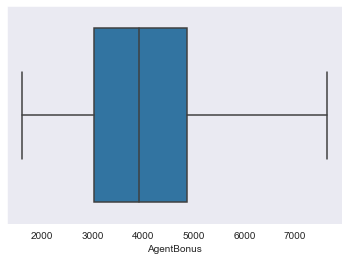

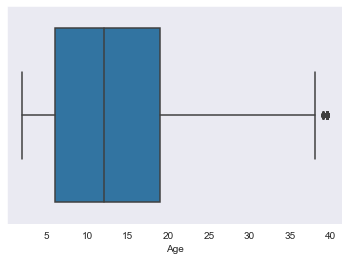

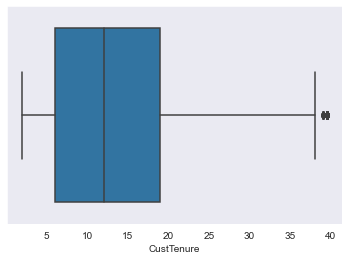

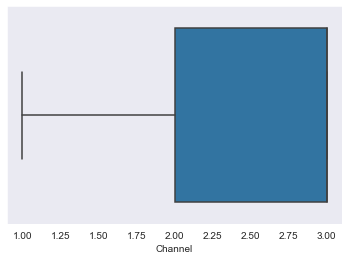

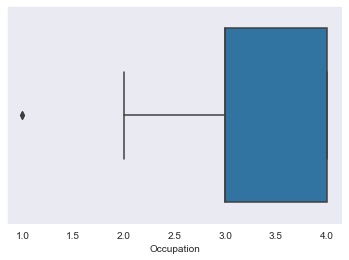

...

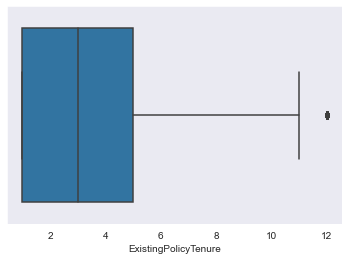

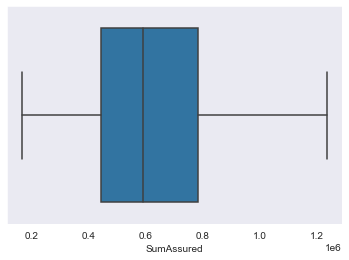

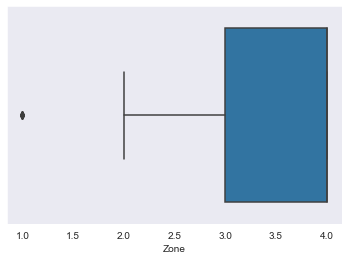

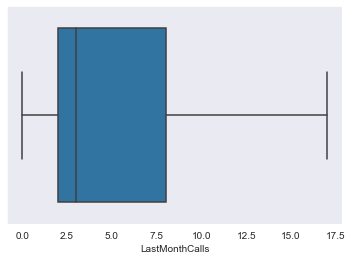

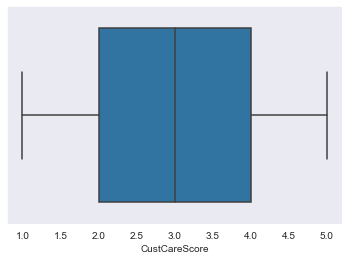

In [62]:
col_names = list(df.select_dtypes(exclude=['object']).columns)
fig, ax = plt.subplots(len(col_names), figsize=(5,50)).
for i,col_val in enumerate(col_names):
    sns.boxplot(df[col_val])
    ax[i].set_title('{}'.format(col_val), fontsize=8)
    plt.show()

# Outlier Treatment

In [19]:
def remove_outlier(col):
    sorted(col)
    Q1,Q3=col.quantile([0.25,0.75])
    IQR=Q3-Q1
    lower_range= Q1-(1.5 * IQR)
    upper_range= Q3+(1.5 * IQR)
    return lower_range, upper_range

In [20]:
for i,col_val in enumerate(col_names):
    lwr,upr=remove_outlier(df[col_val])
    df[col_val]=np.where(df[col_val]>upr,upr,df[col_val])
    df[col_val]=np.where(df[col_val]<lwr,lwr,df[col_val])
    print("Outlier fixed for ", col_val)

Outlier fixed for  CustID
Outlier fixed for  AgentBonus
Outlier fixed for  Age
Outlier fixed for  CustTenure
Outlier fixed for  ExistingProdType
Outlier fixed for  NumberOfPolicy
Outlier fixed for  MonthlyIncome
Outlier fixed for  Complaint
Outlier fixed for  ExistingPolicyTenure
Outlier fixed for  SumAssured
Outlier fixed for  LastMonthCalls
Outlier fixed for  CustCareScore


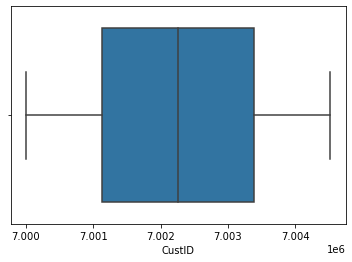

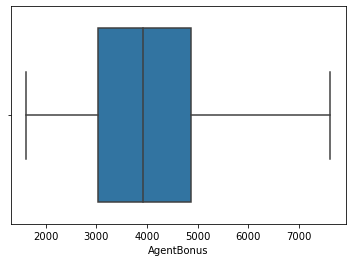

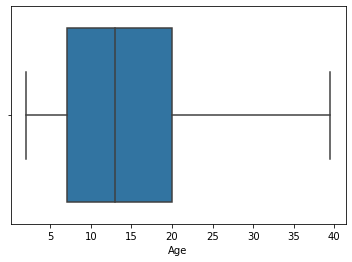

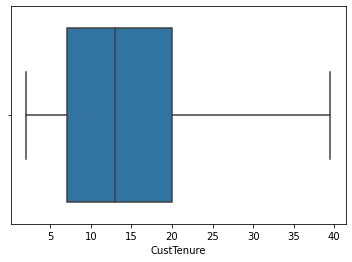

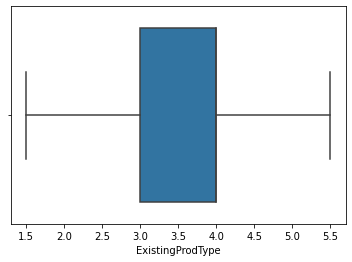

...

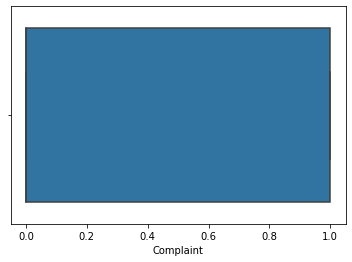

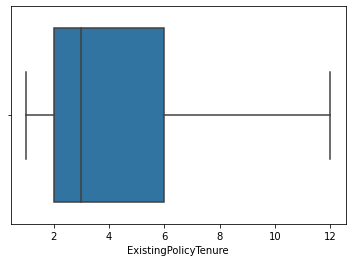

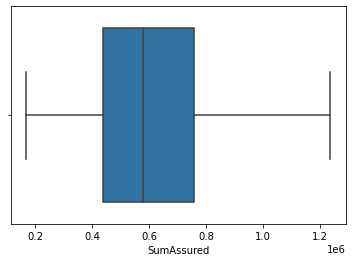

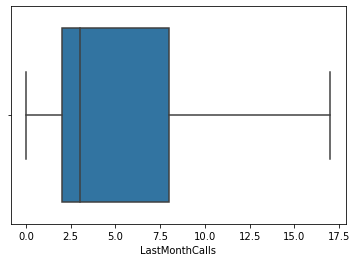

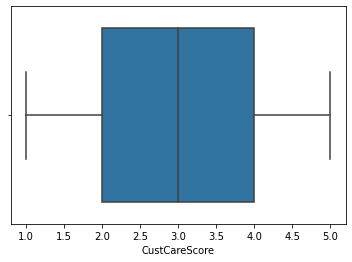

In [21]:
for i,col_val in enumerate(col_names):
    sns.boxplot(df[col_val])
    ax[i].set_title('{}'.format(col_val), fontsize=8)
    plt.show()

# Uni Variate Analysis

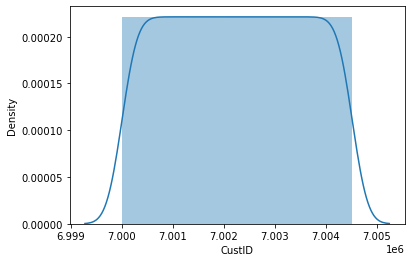

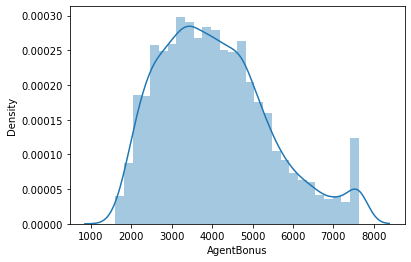

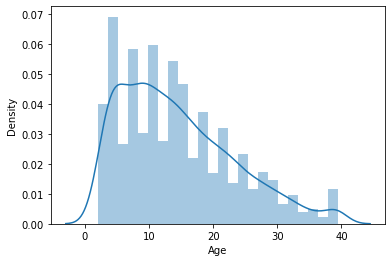

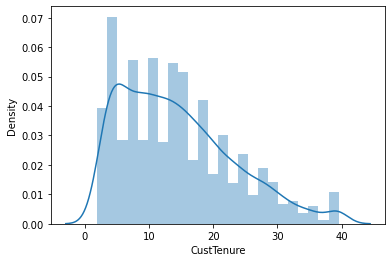

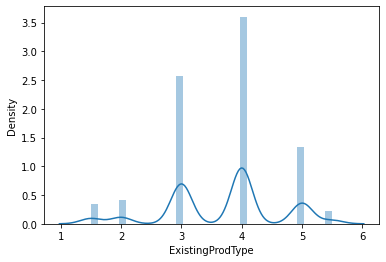

...

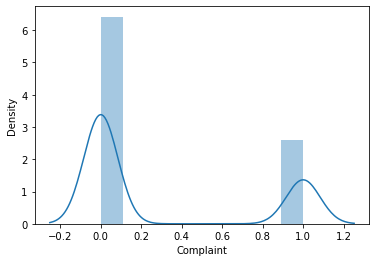

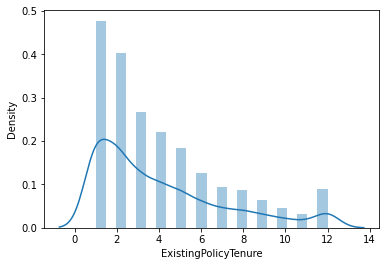

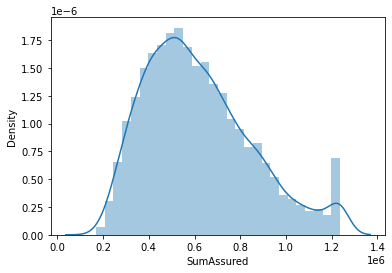

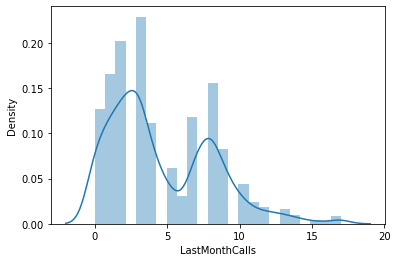

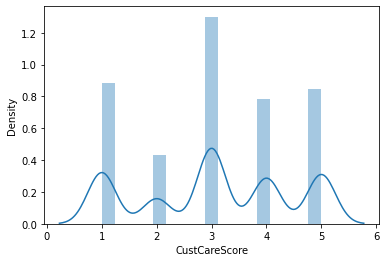

In [22]:
for i,col_val in enumerate(col_names):
    sns.distplot(df[col_val])
    plt.show()

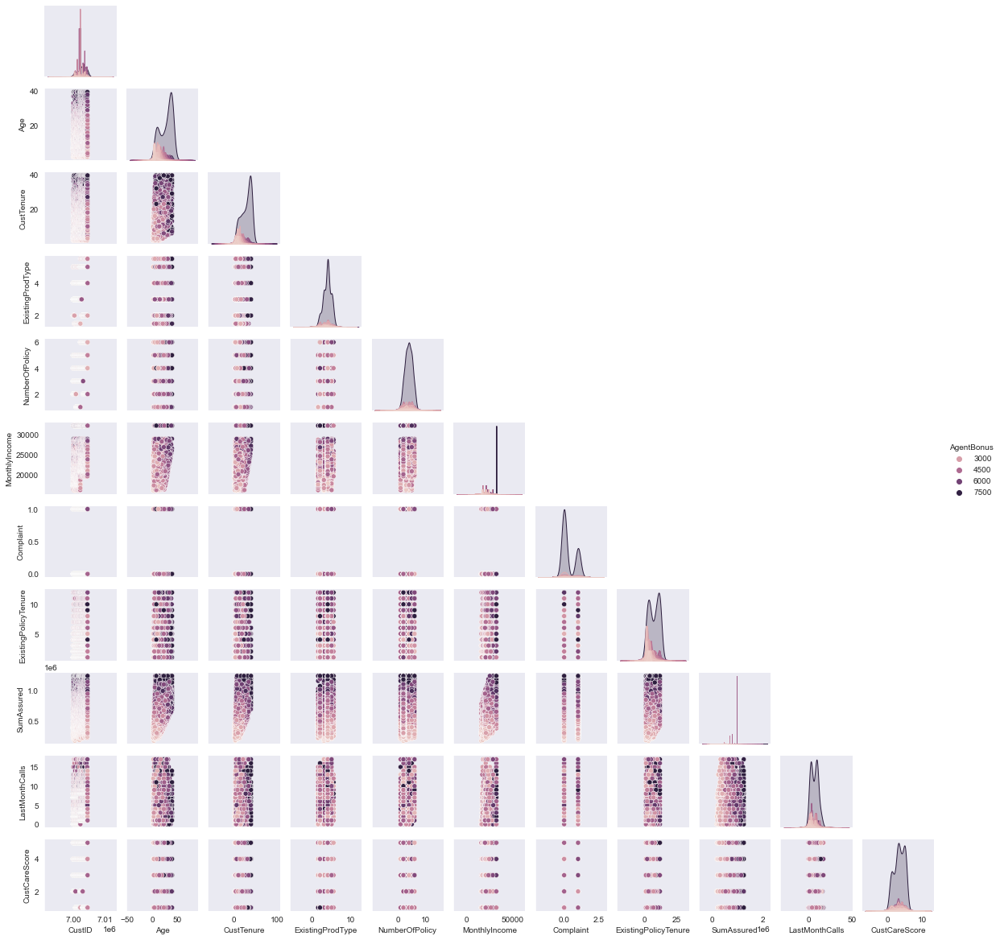

In [23]:
sns.set_style("dark")
sns.pairplot(df,hue="AgentBonus",height=1.5,aspect=1,corner=True)

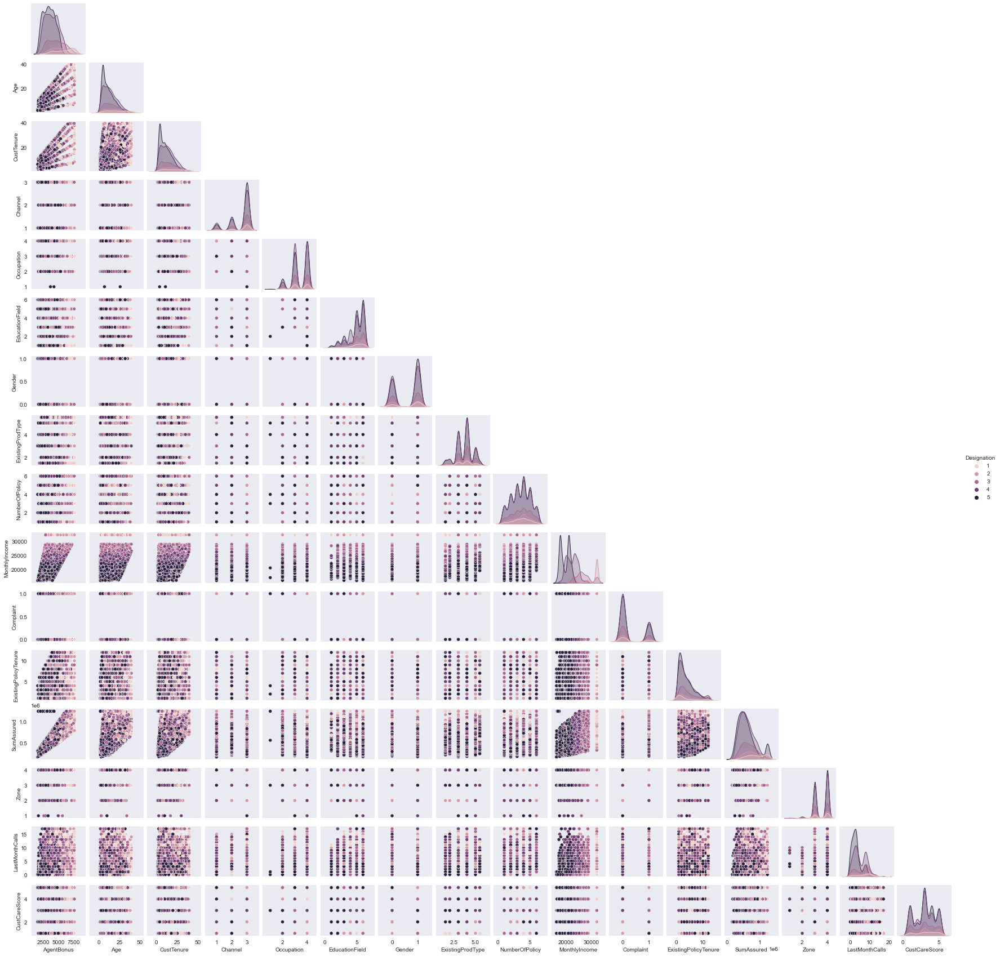

In [60]:
sns.set_style("dark")
sns.pairplot(df,hue="Designation",height=1.5,aspect=1,corner=True)

# BI Variate Analysis

## Previous Bonus

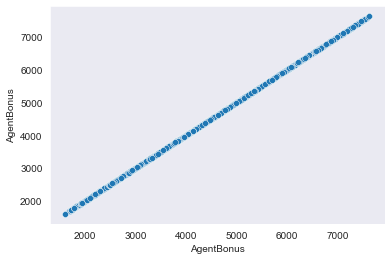

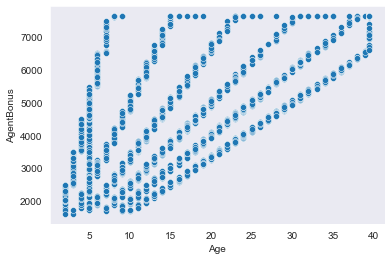

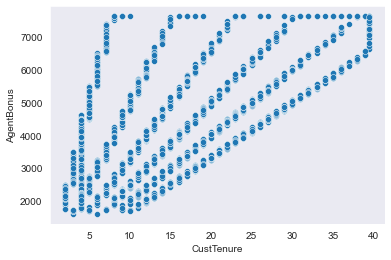

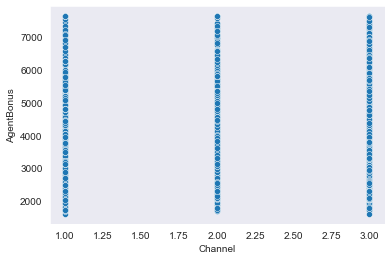

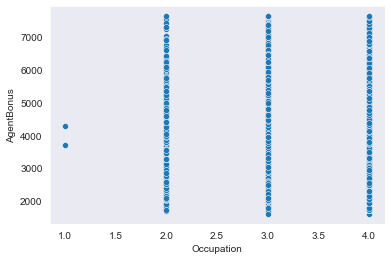

...

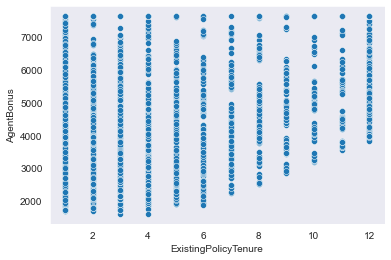

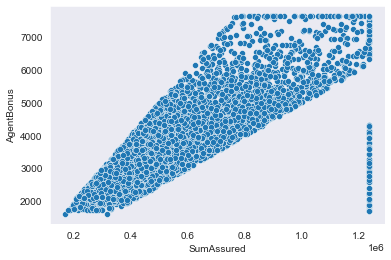

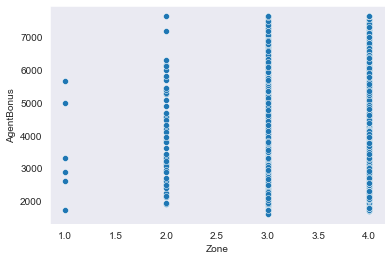

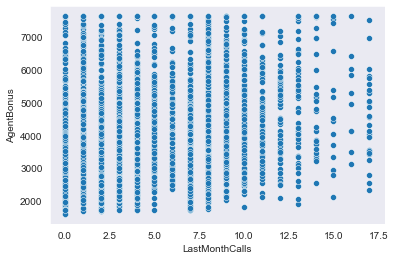

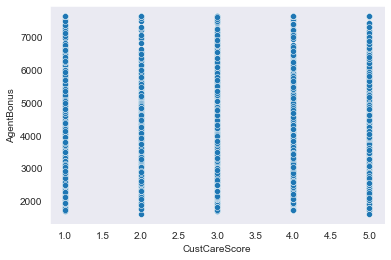

In [59]:
for i,col_val in enumerate(col_names):
    sns.scatterplot(y=df.AgentBonus,x=df[col_val])
    plt.show()

## Channel

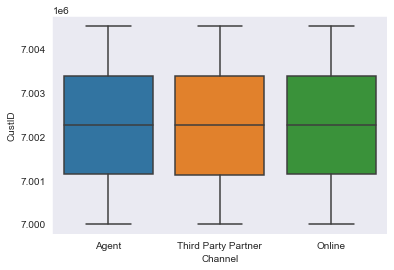

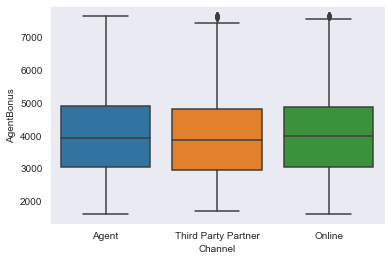

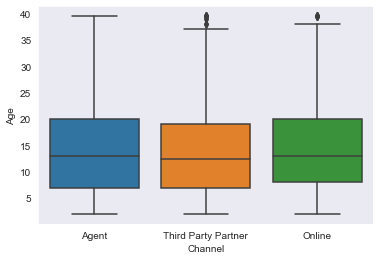

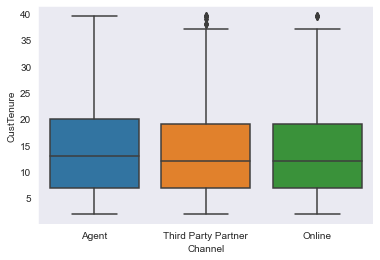

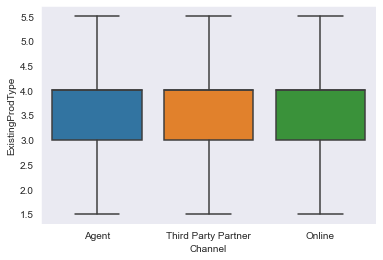

...

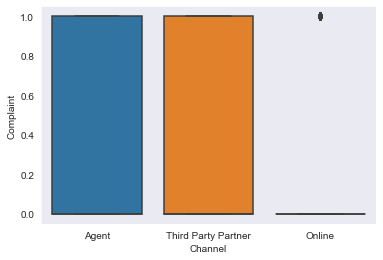

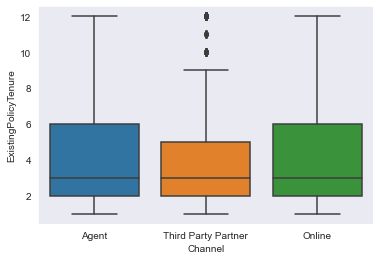

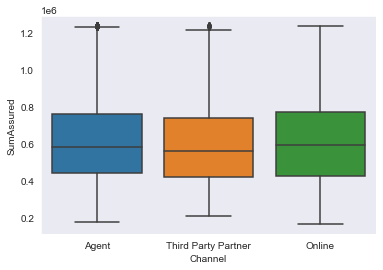

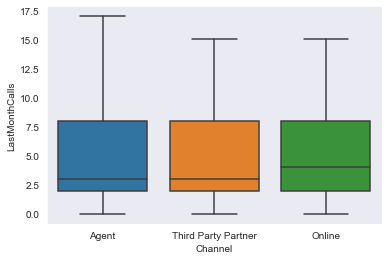

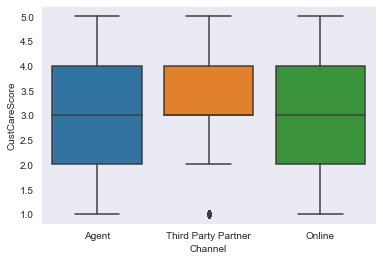

In [25]:
for i,col_val in enumerate(col_names):
    sns.boxplot(y=df[col_val],x=df.Channel)
    plt.show()

## Occupation

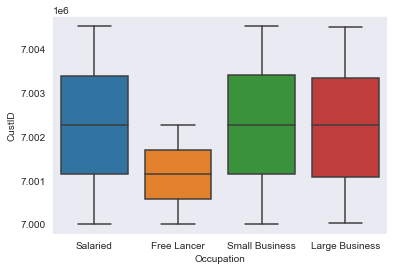

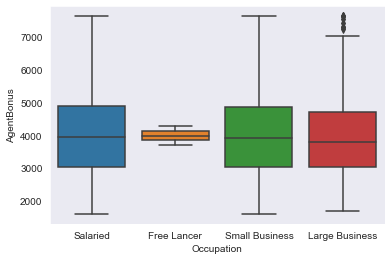

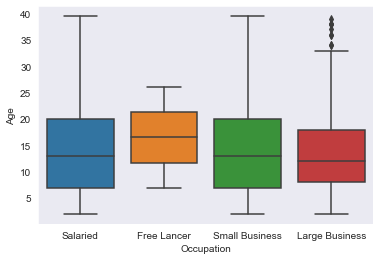

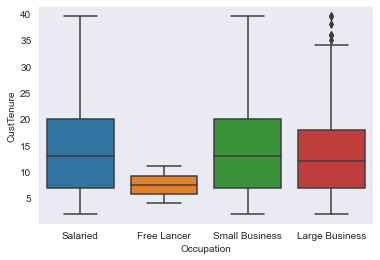

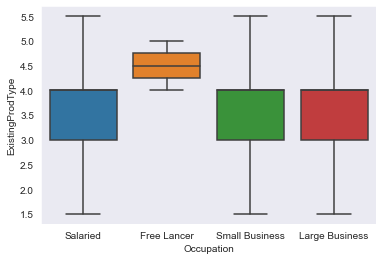

...

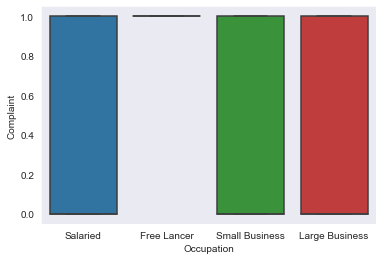

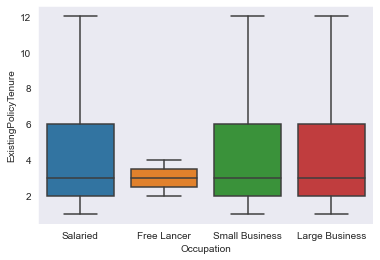

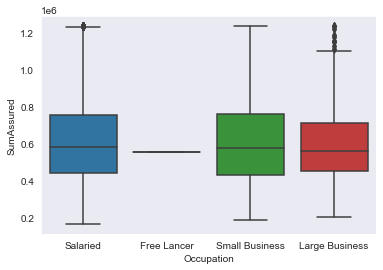

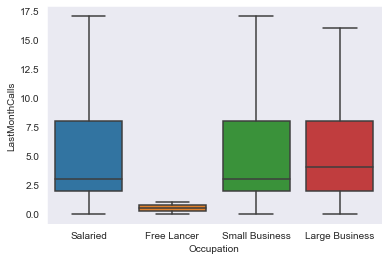

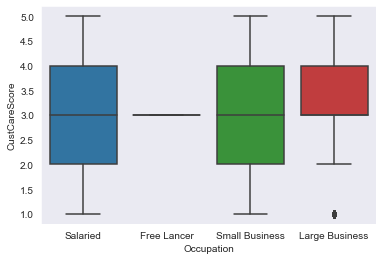

In [26]:
for i,col_val in enumerate(col_names):
    sns.boxplot(y=df[col_val],x=df.Occupation)
    plt.show()

## EducationField

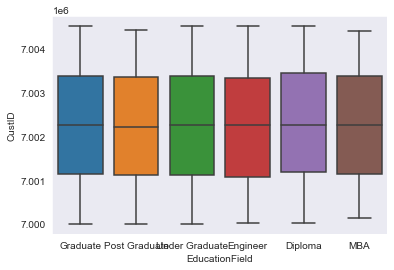

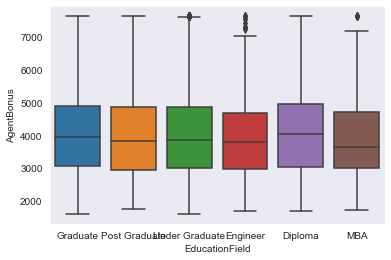

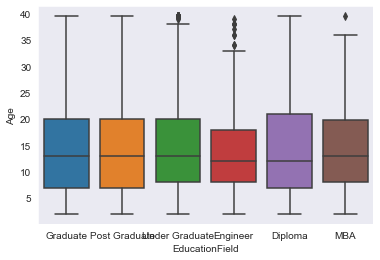

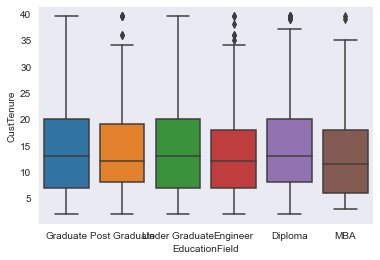

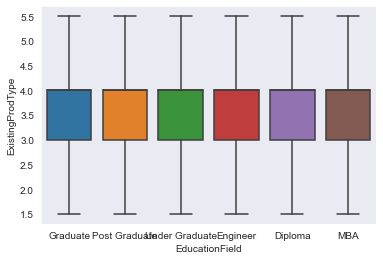

...

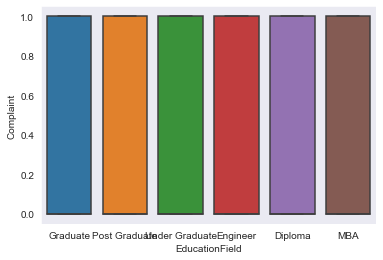

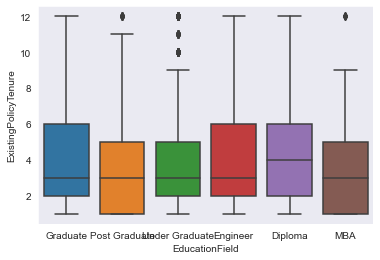

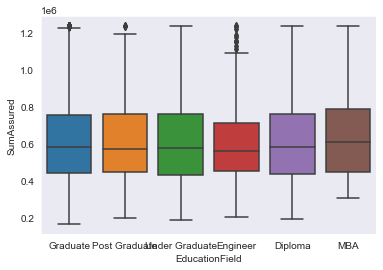

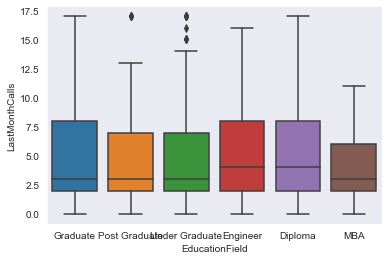

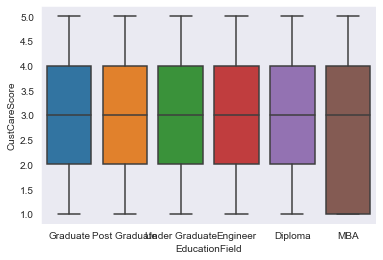

In [27]:
for i,col_val in enumerate(col_names):
    sns.boxplot(y=df[col_val],x=df.EducationField)
    plt.show()

## Gender

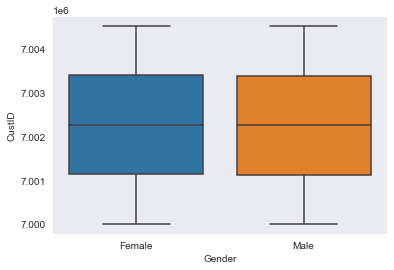

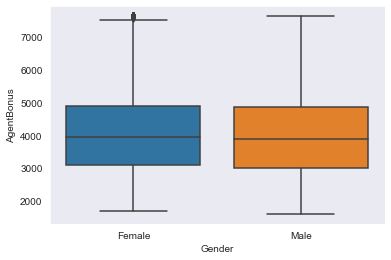

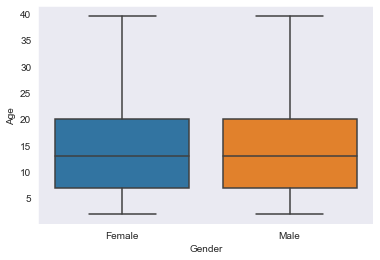

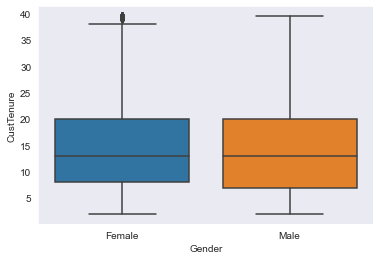

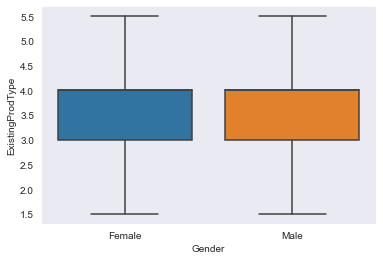

...

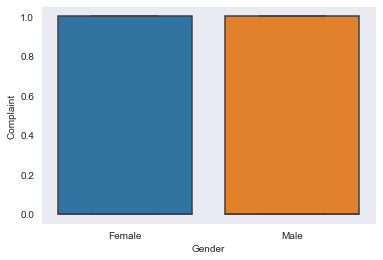

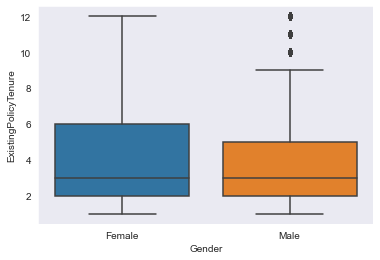

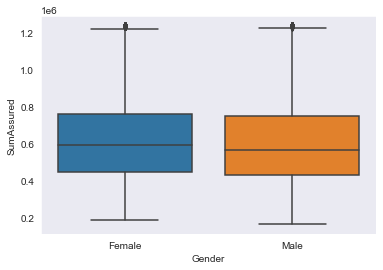

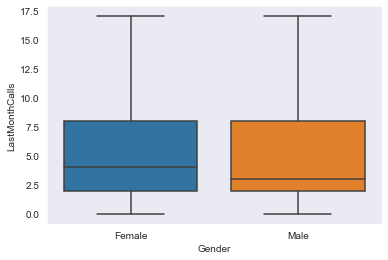

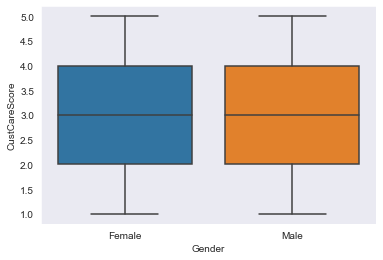

In [28]:
for i,col_val in enumerate(col_names):
    sns.boxplot(y=df[col_val],x=df.Gender)
    plt.show()

## Designation

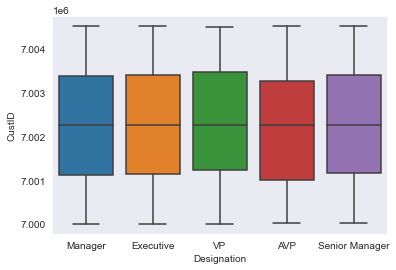

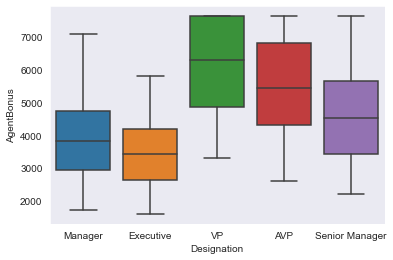

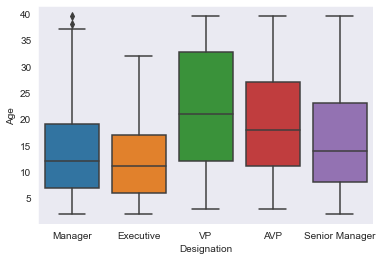

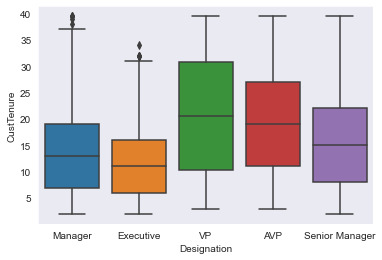

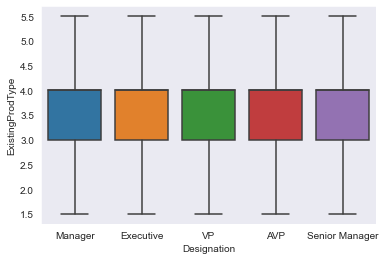

...

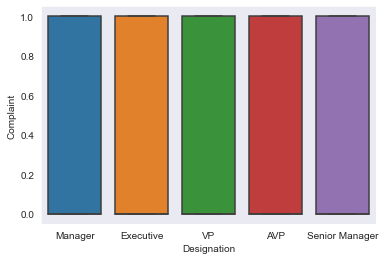

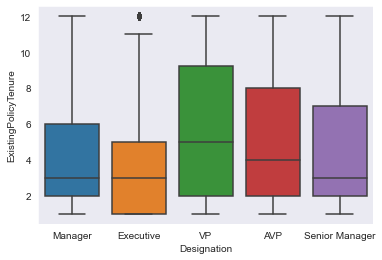

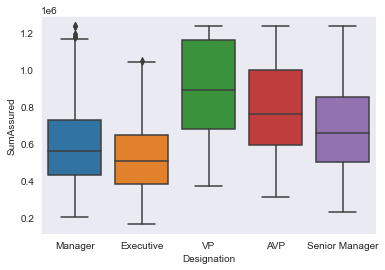

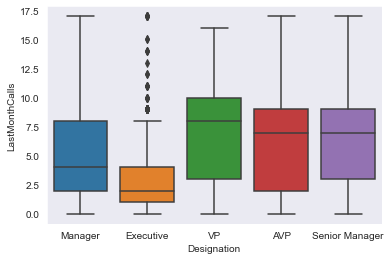

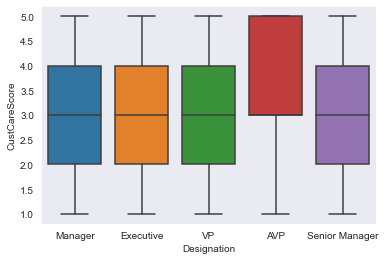

In [29]:
for i,col_val in enumerate(col_names):
    sns.boxplot(y=df[col_val],x=df.Designation)
    plt.show()

## MaritalStatus

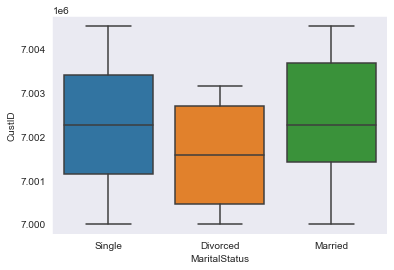

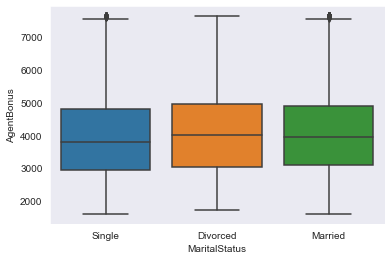

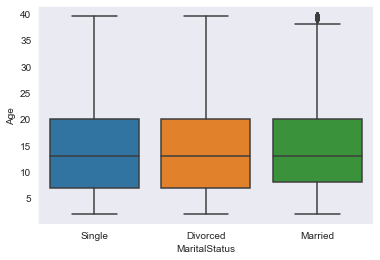

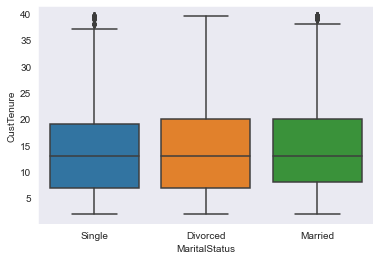

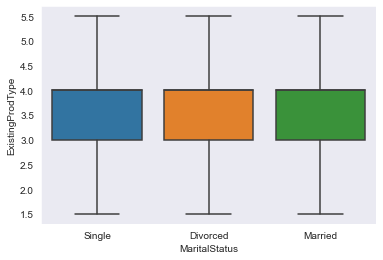

...

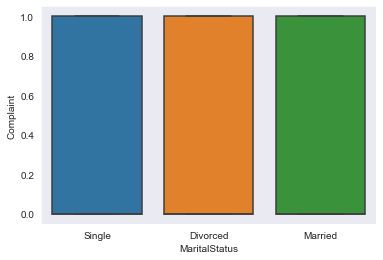

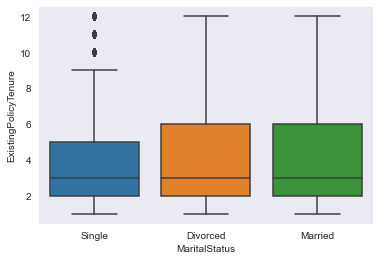

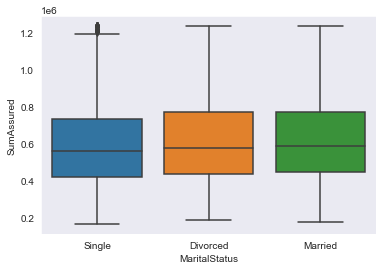

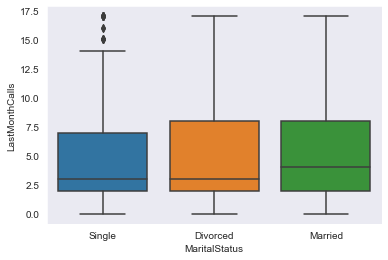

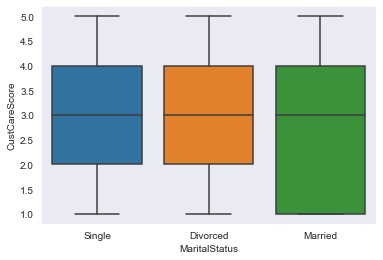

In [30]:
for i,col_val in enumerate(col_names):
    sns.boxplot(y=df[col_val],x=df.MaritalStatus)
    plt.show()

## Zone

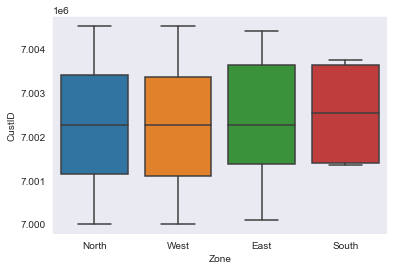

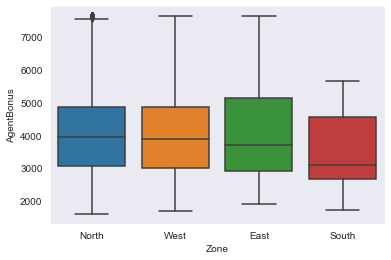

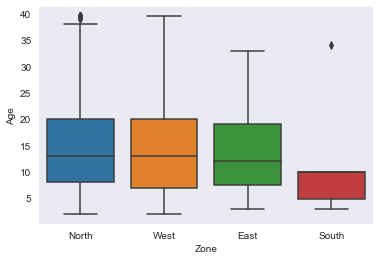

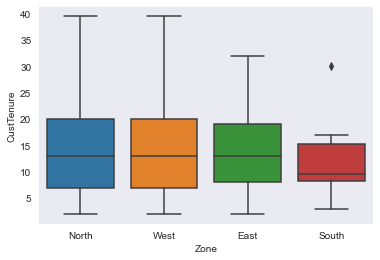

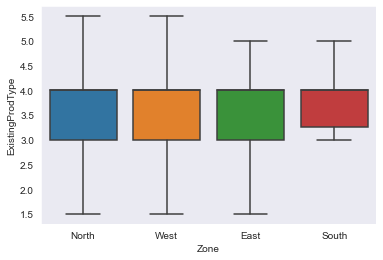

...

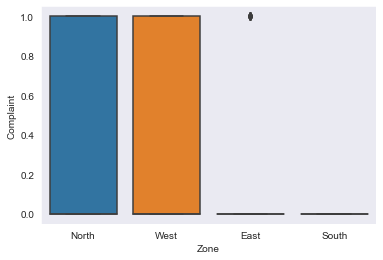

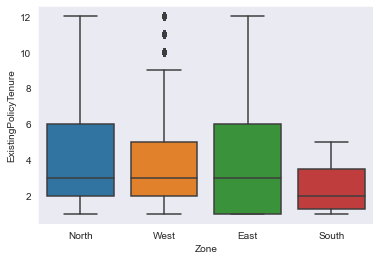

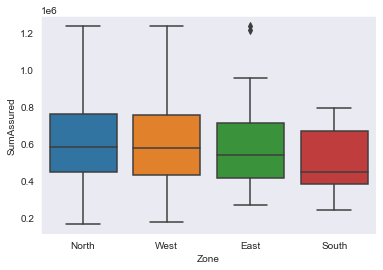

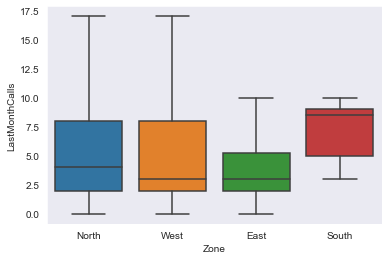

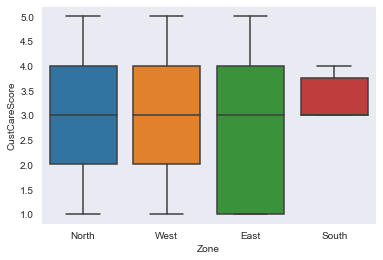

In [31]:
for i,col_val in enumerate(col_names):
    sns.boxplot(y=df[col_val],x=df.Zone)
    plt.show()

## PaymentMethod

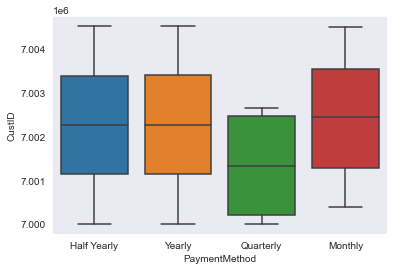

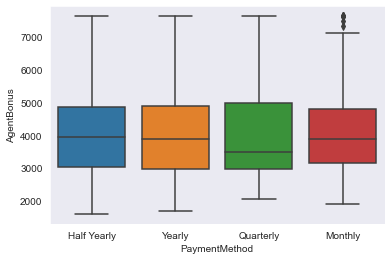

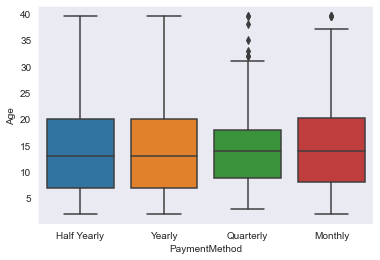

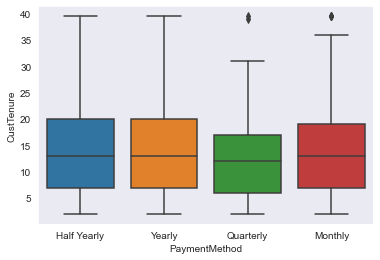

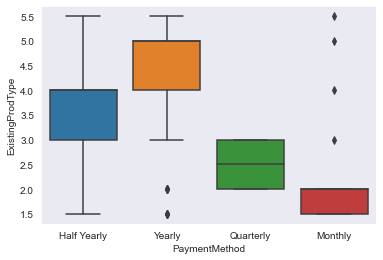

...

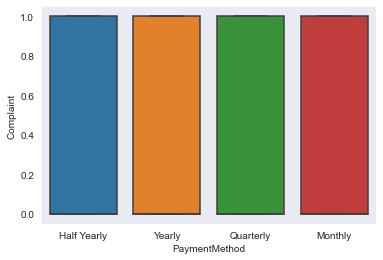

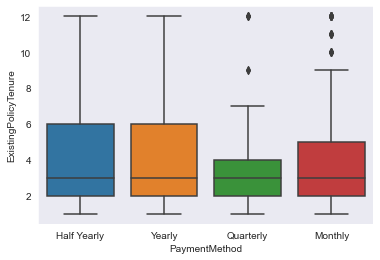

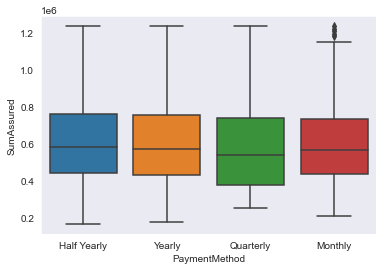

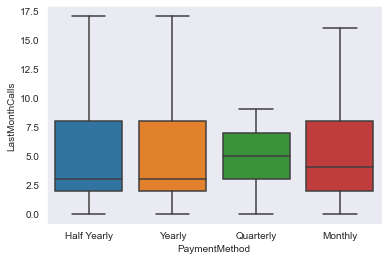

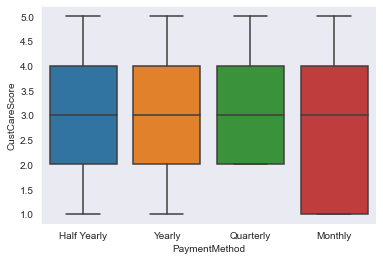

In [32]:
for i,col_val in enumerate(col_names):
    sns.boxplot(y=df[col_val],x=df.PaymentMethod)
    plt.show()

# Scatter Plot for Bi Variate Analysis

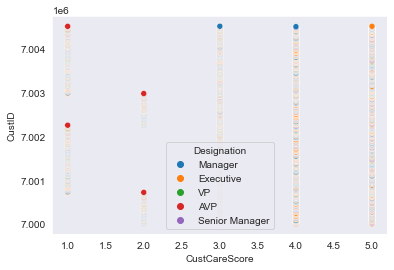

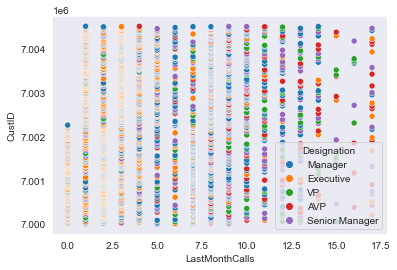

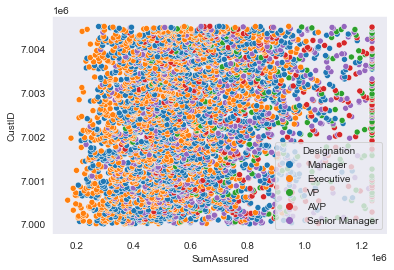

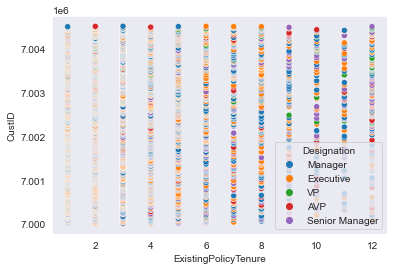

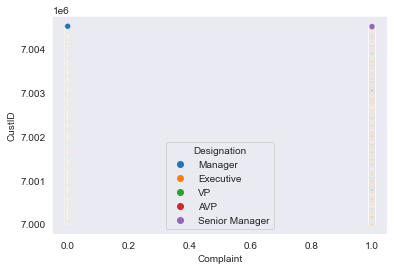

...

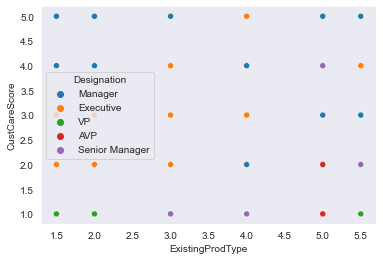

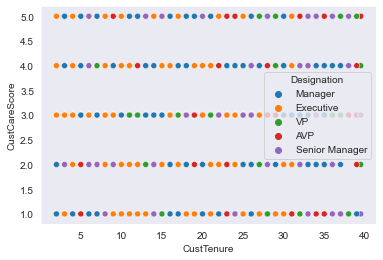

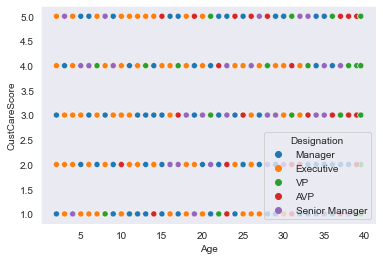

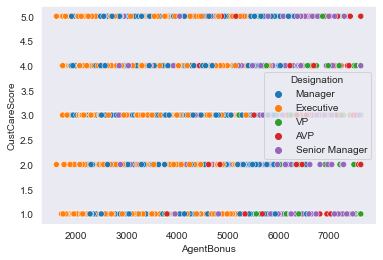

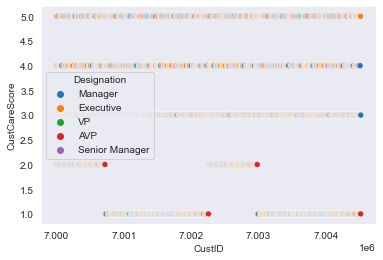

In [33]:
for i,col_val in enumerate(col_names):
    for j,rev_col in reversed(list(enumerate(col_names))):
        sns.scatterplot(y=df[col_val],x=df[rev_col],hue=df.Designation)
        plt.show()

# Delete Variables Not Meaningful to Analysis

In [34]:
df.drop(['CustID','MaritalStatus','PaymentMethod'],axis=1,inplace=True)

# Zero value check

In [35]:
df.eq(0).any().sum()

2

There are two features with 0 values

In [36]:
df.eq(0).sum()

AgentBonus                 0
Age                        0
CustTenure                 0
Channel                    0
Occupation                 0
EducationField             0
Gender                     0
ExistingProdType           0
Designation                0
NumberOfPolicy             0
MonthlyIncome              0
Complaint               3222
ExistingPolicyTenure       0
SumAssured                 0
Zone                       0
LastMonthCalls           408
CustCareScore              0
dtype: int64

- The 2 features where we have 0 values.

- Given that 0 are allowed values for these features , any treatment is ruled out

# Duplicate check

In [37]:
df.duplicated().sum()

0

- No Duplicates found

In [38]:
df.shape

(4520, 17)

# Missing value check

In [39]:
print ('There are', df.isnull().sum().sum(),'missing values in the dataset')

There are 1166 missing values in the dataset


In [40]:
pd.set_option('max_rows', None)
df.isnull().sum().sort_values(ascending=False)

Age                     269
MonthlyIncome           236
CustTenure              226
ExistingPolicyTenure    184
SumAssured              154
CustCareScore            52
NumberOfPolicy           45
LastMonthCalls            0
Zone                      0
Complaint                 0
AgentBonus                0
ExistingProdType          0
Gender                    0
EducationField            0
Occupation                0
Channel                   0
Designation               0
dtype: int64

In [41]:
null_rows=0
for i in (df.isnull().sum(axis=1)):
    if i>0 :
        null_rows=null_rows+1
print (" Total Missing Rows ",null_rows)

 Total Missing Rows  1073


- There can be two options for Missing Value Treatment 
    - Either impute the missing values with median or median values for Numeric columns while mode values for categorical columns 
    - Drop the rows with missing values but then we are looking at almost 23.74% reduction in data (3447 out of 4520 rows) and hence ruled out 

So, Impute the missing values with the mode value of the column.

# Missing value treatment

### Imputing with Mode 

In [42]:
from sklearn.impute import SimpleImputer
imputer = SimpleImputer(strategy='most_frequent',missing_values=np.nan)

In [43]:
for i,col_val in enumerate(list(df.columns)):
    if df[col_val].isnull().sum()>0 :
        df[col_val]=imputer.fit_transform(df[col_val].values.reshape(-1,1))[:,0]

In [44]:
df.isnull().sum()

AgentBonus              0
Age                     0
CustTenure              0
Channel                 0
Occupation              0
EducationField          0
Gender                  0
ExistingProdType        0
Designation             0
NumberOfPolicy          0
MonthlyIncome           0
Complaint               0
ExistingPolicyTenure    0
SumAssured              0
Zone                    0
LastMonthCalls          0
CustCareScore           0
dtype: int64

In [45]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4520 entries, 0 to 4519
Data columns (total 17 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   AgentBonus            4520 non-null   float64
 1   Age                   4520 non-null   float64
 2   CustTenure            4520 non-null   float64
 3   Channel               4520 non-null   object 
 4   Occupation            4520 non-null   object 
 5   EducationField        4520 non-null   object 
 6   Gender                4520 non-null   object 
 7   ExistingProdType      4520 non-null   float64
 8   Designation           4520 non-null   object 
 9   NumberOfPolicy        4520 non-null   float64
 10  MonthlyIncome         4520 non-null   float64
 11  Complaint             4520 non-null   float64
 12  ExistingPolicyTenure  4520 non-null   float64
 13  SumAssured            4520 non-null   float64
 14  Zone                  4520 non-null   object 
 15  LastMonthCalls       

# Duplicate check After Missing Treatment

In [46]:
df.duplicated().sum()

0

In [47]:
df.shape

(4520, 17)

# Encoding Columns

In [48]:
df['Channel'] = df['Channel'].replace(to_replace='Online',value=1)
df['Channel'] = df['Channel'].replace(to_replace='Third Party Partner',value=2)
df['Channel'] = df['Channel'].replace(to_replace='Agent',value=3)

In [49]:
df['Occupation'] = df['Occupation'].replace(to_replace='Free Lancer',value=1)
df['Occupation'] = df['Occupation'].replace(to_replace='Large Business',value=2)
df['Occupation'] = df['Occupation'].replace(to_replace='Small Business',value=3)
df['Occupation'] = df['Occupation'].replace(to_replace='Salaried',value=4)

In [50]:
df['EducationField'] = df['EducationField'].replace(to_replace='MBA',value=1)
df['EducationField'] = df['EducationField'].replace(to_replace='Post Graduate',value=2)
df['EducationField'] = df['EducationField'].replace(to_replace='Engineer',value=3)
df['EducationField'] = df['EducationField'].replace(to_replace='Diploma',value=4)
df['EducationField'] = df['EducationField'].replace(to_replace='Under Graduate',value=5)
df['EducationField'] = df['EducationField'].replace(to_replace='Graduate',value=6)

In [51]:
df['Gender'] = df['Gender'].replace(to_replace='Female',value=0)
df['Gender'] = df['Gender'].replace(to_replace='Male',value=1)

In [52]:
df['Designation'] = df['Designation'].replace(to_replace='VP',value=1)
df['Designation'] = df['Designation'].replace(to_replace='AVP',value=2)
df['Designation'] = df['Designation'].replace(to_replace='Senior Manager',value=3)
df['Designation'] = df['Designation'].replace(to_replace='Manager',value=4)
df['Designation'] = df['Designation'].replace(to_replace='Executive',value=5)

In [53]:
df['Zone'] = df['Zone'].replace(to_replace='South',value=1)
df['Zone'] = df['Zone'].replace(to_replace='East',value=2)
df['Zone'] = df['Zone'].replace(to_replace='North',value=3)
df['Zone'] = df['Zone'].replace(to_replace='West',value=4)

In [54]:
df1=pd.get_dummies(df,columns=['Designation','EducationField'])

In [55]:
df1

,AgentBonus,Age,CustTenure,Channel,Occupation,Gender,ExistingProdType,NumberOfPolicy,MonthlyIncome,Complaint,...,Designation_2,Designation_3,Designation_4,Designation_5,EducationField_1,EducationField_2,EducationField_3,EducationField_4,EducationField_5,EducationField_6
0,4409.00,22.00,4.00,3,4,0,3.00,2.00,20993.00,1.00,...,0,0,1,0,0,0,0,0,0,1
1,2214.00,11.00,2.00,2,4,1,4.00,4.00,20130.00,0.00,...,0,0,1,0,0,0,0,0,0,1
2,4273.00,26.00,4.00,3,1,1,4.00,3.00,17090.00,1.00,...,0,0,0,1,0,1,0,0,0,0
3,1791.00,11.00,4.00,2,4,0,3.00,3.00,17909.00,1.00,...,0,0,0,1,0,0,0,0,0,1
4,2955.00,6.00,4.00,3,3,1,3.00,4.00,18468.00,0.00,...,0,0,0,1,0,0,0,0,1,0
5,3252.00,7.00,4.00,2,4,1,3.00,2.00,18068.00,0.00,...,0,0,0,1,0,0,0,0,0,1
6,3850.00,12.00,23.00,3,4,1,4.00,3.00,32287.25,0.00,...,0,0,0,0,0,0,0,0,0,1
7,2073.00,6.00,4.00,3,3,0,3.00,4.00,17279.00,0.00,...,0,0,0,1,0,0,0,0,1,0
8,2719.00,8.00,11.00,3,4,1,4.00,3.00,20916.00,1.00,...,0,0,1,0,0,0,0,0,0,1
9,3247.00,6.00,3.00,1,3,1,2.00,2.00,17089.00,0.00,...,0,0,0,1,0,0,0,0,1,0


# Correlation

<AxesSubplot:>

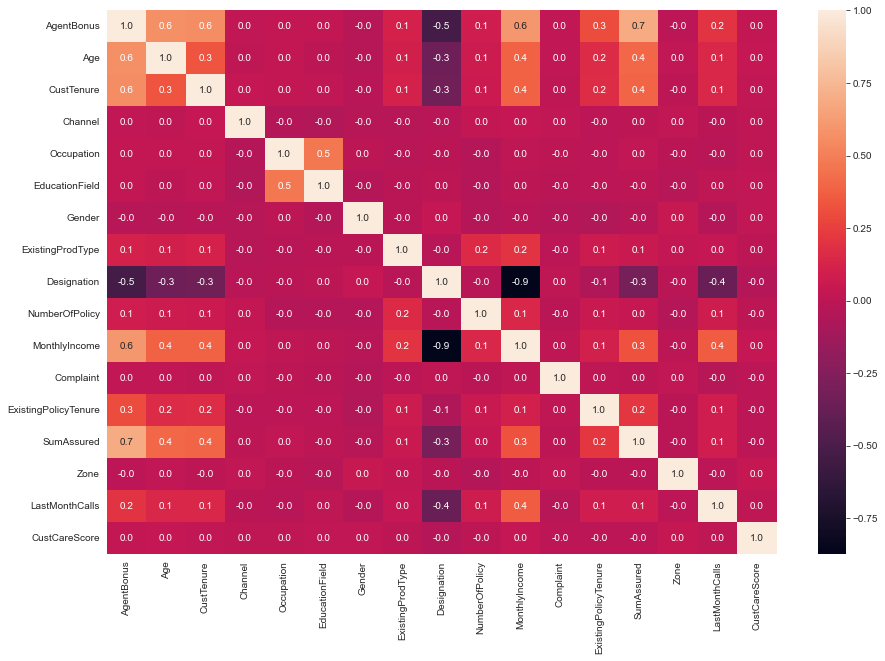

In [56]:
plt.figure(figsize=(15,10))
sns.heatmap(df.corr(), annot=True, fmt=".1f",square=False)

<AxesSubplot:>

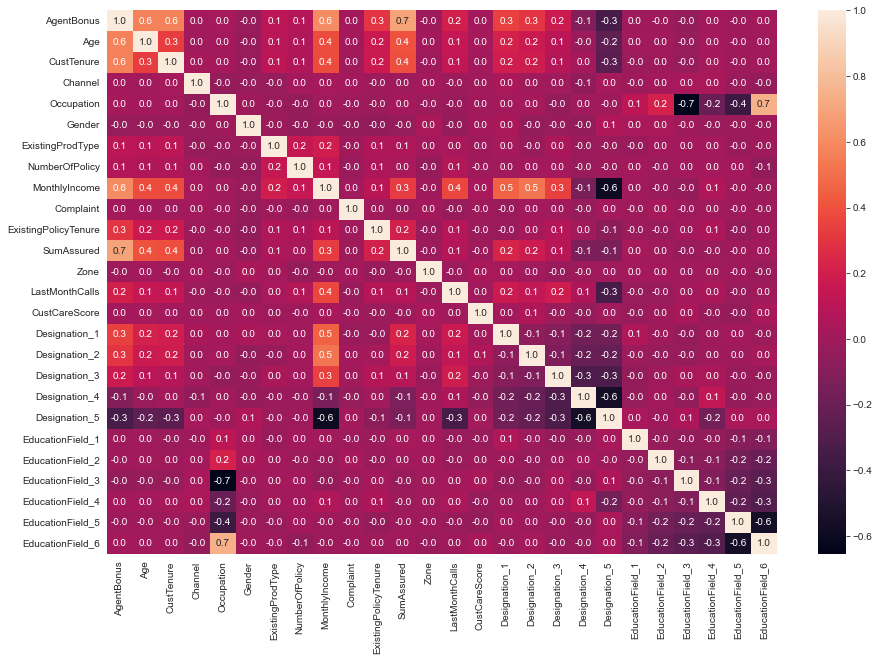

In [57]:
plt.figure(figsize=(15,10))
sns.heatmap(df1.corr(), annot=True, fmt=".1f",square=False)